In [1]:
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import display
import pandas as pd
import numpy as np
import json
import re
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
import nltk
from wordcloud import WordCloud
import cv2
import os

In [2]:
# Sets the Ipython options

InteractiveShell.ast_node_interactivity = "all"

In [3]:
# Design

# Sizes

title_size = 50
tick_size = 30
text_size = 30

# Colors

sns.color_palette('PuOr')

[(0.7746251441753171, 0.4129181084198385, 0.04613610149942329),
 (0.9765474817377932, 0.6925028835063436, 0.34571318723567845),
 (0.9885428681276432, 0.9031910803537101, 0.7836985774702038),
 (0.8804306036139947, 0.8861207227989235, 0.9344867358708189),
 (0.671126489811611, 0.6404459823144946, 0.8030757400999616),
 (0.40046136101499424, 0.2756632064590542, 0.5914648212226067)]

In [4]:
# Functions


def return_missing_values_df_bar(df, bars=True):

    """Displays nans in percent"""

    missing_percent_df = \
        pd.DataFrame(100 - (df.count()/df.shape[0])*100,
                     columns=['Missing Values'])

    if bars:
        return missing_percent_df[missing_percent_df['Missing Values'] > 0]\
                                 .style.bar(color=sns.color_palette('PuOr')
                                            .as_hex()[4])
    else:
        return missing_percent_df[missing_percent_df['Missing Values'] > 0]


def retrieve_image(image):

    """Returns a specified image from the below folder"""

    return Image.open(r'F:\Data\Projet 6\Flipkart\Images\{}'.format(image))


def create_category_node(value, node):

    """Creates a specified tree node
    according to the product_category_tree"""

    node = node - 1
    node_list = re.split('>>', value)

    if len(node_list) > node:
        # Removes brackets and "" in first and last node
        node_list[node] = re.sub(r'(\")|(\[)|(\])', '', node_list[node])

        return node_list[node].strip()
    else:
        return np.nan


def add_unique_id_to_product_specifications_dict(row):

    """Adds unique_id into product_specifications_dict"""

    unique_id_added = \
        re.sub('"}',
               '\", "uniq_id": "{}"'.format(row['uniq_id']) + '}',
               row['product_specifications_formatted'])

    return unique_id_added


def correct_product_specifications_json_conflicts(value):

    """Corrects some conflicts for product_specifications's
    json transformation """

    list_per_value = re.split('\",', value)

    is_json_compatible = []

    # General Cases

    for i in range(len(list_per_value)):
        if re.compile('\": \"').search(list_per_value[i]):
            is_json_compatible.append(1)
        else:
            is_json_compatible.append(0)

    is_json_compatible = np.array(is_json_compatible)

    reconstruction = ''
    others = ''

    for j in np.where(is_json_compatible == 1)[0]:
        reconstruction = reconstruction + list_per_value[j] + '\",'

    reconstruction = re.sub('}",', '', str(reconstruction))

    for k in np.where(is_json_compatible == 0)[0]:
        others = others + list_per_value[k] + ','

    others = re.sub('\"', '', others)

    reconstructed = reconstruction + ', \"Other\": \"' + others + '\"}'

    if re.compile('^{').search(reconstructed):

        return reconstructed

    # Particular cases (38 samples concerned)

    else:
        reconstructed = '{' + reconstructed
        reconstructed = re.sub(',,', ',', reconstructed)
        reconstructed = re.sub('\"\",', '\",', reconstructed)
        reconstructed = re.sub('^{, ', '{', reconstructed)

        return reconstructed

    
# NLP Functions


def tokenize_doc_no_punct(document):
    
    """Returns tokenized document.
    Tokens are in lower case. 
    The punctuation isn't kept."""
    
    doc = nlp.make_doc(document)
    tokens = [token.lower_ for token in doc if not token.is_punct and not token.is_space]
    
    return tokens


def tokenize_doc_no_punct_no_stop_words(document, stop_word_list):
    
    """Returns tokenized document.
    Tokens are in lower case. 
    The punctuation isn't kept.
    The stop words aren't kept"""
    
    doc = nlp.make_doc(document)
    tokens = [token.lower_ for token in doc if not token.is_punct and not token.is_space]
    
    # As the stop word list will be customized, the usage of token.is_stop isn't used
    # because of a spacy current bug 

    tokens = [token for token in tokens if token not in stop_word_list]
    
    return tokens

In [5]:
# Imports the dataset

flipkart_df = \
    pd.read_csv(
        r'F:\Data\Projet 6\Flipkart\flipkart_com-ecommerce_sample_1050.csv')

# Forks a copy of the dataframe

flipkart_fork_1 = flipkart_df.copy()

# Random Seed

random_seed = 34

# Path for images

path = r'F:\Data\Projet 6\Flipkart\Images\\'

<center><h6>EDA

<h6>Global

In [6]:
flipkart_fork_1.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [7]:
flipkart_fork_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [8]:
flipkart_fork_1.shape

(1050, 15)

In [9]:
flipkart_fork_1.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

In [10]:
# Displays Missing Values

return_missing_values_df_bar(flipkart_fork_1)

,Missing Values
retail_price,0.095238
discounted_price,0.095238
brand,32.190476
product_specifications,0.095238


<h6>Numerical

In [11]:
flipkart_fork_1.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


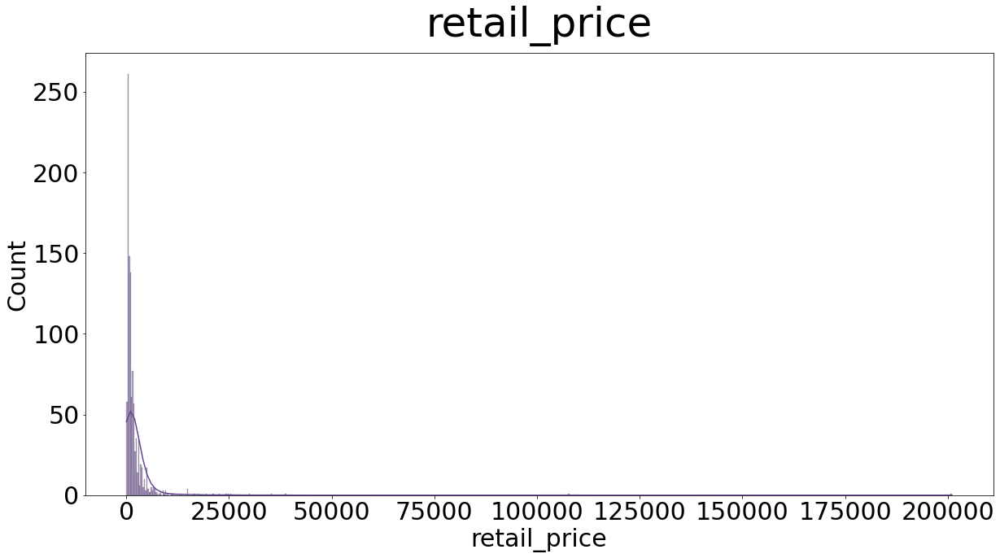

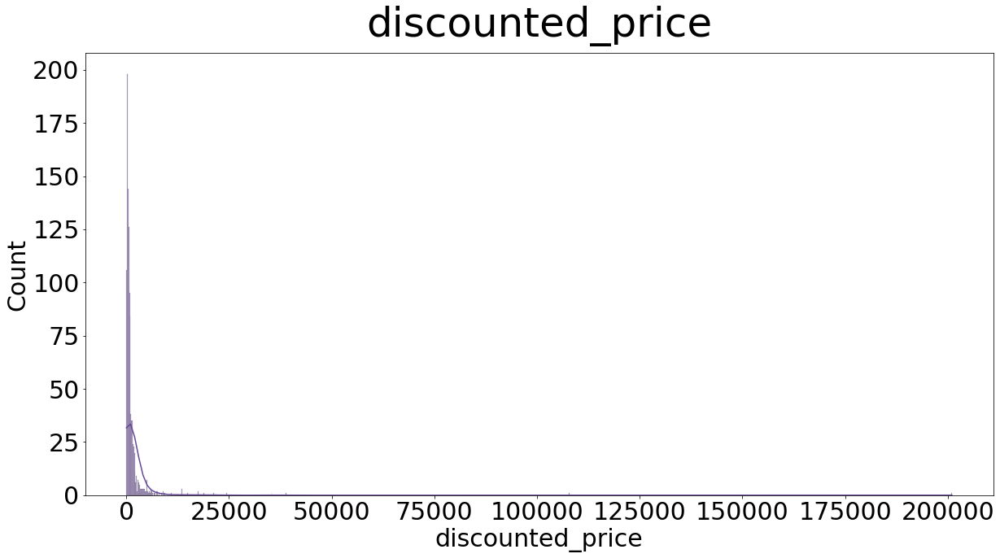

In [12]:
# Plots numerical features

for i in flipkart_fork_1.select_dtypes('float').columns:

    fig, ax = plt.subplots(figsize=(20, 10))
    sns.histplot(data=flipkart_fork_1,
                 x=i,
                 kde=True,
                 color=sns.color_palette('PuOr')[5],
                 ax=ax)
    ax.tick_params(labelsize=tick_size)
    ax.set_xlabel('{}'.format(i), fontsize=text_size)
    ax.set_ylabel('Count', fontsize=text_size)
    plt.title('{}'.format(i), fontsize=title_size, pad=20)

plt.show();

<h6>Categorical

<center>Tabularisation of some categorical data

In [13]:
# Category tree

# Displays an example of the structure of the category tree

flipkart_fork_1['product_category_tree'].tolist()[5]

# Displays the count of maximum nodes per tree

flipkart_fork_1['product_category_tree']\
    .apply(lambda x: len(re.split('>>', x)))\
    .value_counts()

'["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]'

3    368
5    278
4    274
6     70
7     57
2      3
Name: product_category_tree, dtype: int64

In [14]:
# Creates the first three category nodes

flipkart_fork_1['product_category_node_1'] = \
    flipkart_fork_1['product_category_tree']\
    .apply(lambda x: create_category_node(x, 1))

flipkart_fork_1['product_category_node_2'] = \
    flipkart_fork_1['product_category_tree']\
    .apply(lambda x: create_category_node(x, 2))

flipkart_fork_1['product_category_node_3'] = \
    flipkart_fork_1['product_category_tree']\
    .apply(lambda x: create_category_node(x, 3))

# Displays the head of created features

flipkart_fork_1[['product_category_node_1',
                 'product_category_node_2',
                 'product_category_node_3']].head()

,product_category_node_1,product_category_node_2,product_category_node_3
0,Home Furnishing,Curtains & Accessories,Curtains
1,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,Baby Care,Baby Bath & Skin,Baby Bath Towels
3,Home Furnishing,Bed Linen,Bedsheets
4,Home Furnishing,Bed Linen,Bedsheets


In [15]:
# Product Specification

# Displays an example of the structure of the product specification

flipkart_fork_1['product_specifications'].tolist()[0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

In [16]:
# Removes principal redundancies

flipkart_fork_1['product_specifications_formatted'] = \
    flipkart_fork_1['product_specifications']\
    .apply(lambda x:
           re.sub('(\"product_specification\")|(\"key\")|(\"value\")|(=>)',
                  '', str(x)))

flipkart_fork_1['product_specifications_formatted'].tolist()[0]

'{[{"Brand", "Elegance"}, {"Designed For", "Door"}, {"Type", "Eyelet"}, {"Model Name", "Abstract Polyester Door Curtain Set Of 2"}, {"Model ID", "Duster25"}, {"Color", "Multicolor"}, {"Length", "213 cm"}, {"Number of Contents in Sales Package", "Pack of 2"}, {"Sales Package", "2 Curtains"}, {"Material", "Polyester"}]}'

In [17]:
# Changes ", sequence in ": for dict style format preparation

flipkart_fork_1['product_specifications_formatted'] = \
    flipkart_fork_1['product_specifications_formatted']\
    .apply(lambda x: re.sub('\",', '\":', x))

flipkart_fork_1['product_specifications_formatted'].tolist()[0]

'{[{"Brand": "Elegance"}, {"Designed For": "Door"}, {"Type": "Eyelet"}, {"Model Name": "Abstract Polyester Door Curtain Set Of 2"}, {"Model ID": "Duster25"}, {"Color": "Multicolor"}, {"Length": "213 cm"}, {"Number of Contents in Sales Package": "Pack of 2"}, {"Sales Package": "2 Curtains"}, {"Material": "Polyester"}]}'

In [18]:
# Removes brackets

flipkart_fork_1['product_specifications_formatted'] =\
    flipkart_fork_1['product_specifications_formatted']\
    .apply(lambda x: re.sub('({)|(})', '', x))

flipkart_fork_1['product_specifications_formatted'].tolist()[0]

'["Brand": "Elegance", "Designed For": "Door", "Type": "Eyelet", "Model Name": "Abstract Polyester Door Curtain Set Of 2", "Model ID": "Duster25", "Color": "Multicolor", "Length": "213 cm", "Number of Contents in Sales Package": "Pack of 2", "Sales Package": "2 Curtains", "Material": "Polyester"]'

In [19]:
# Removes brackets

flipkart_fork_1['product_specifications_formatted'] = \
    flipkart_fork_1['product_specifications_formatted']\
    .apply(lambda x: re.sub(r'\[', '{', x))\
    .apply(lambda x: re.sub(r'\]', '}', x))

flipkart_fork_1['product_specifications_formatted'].tolist()[0]

'{"Brand": "Elegance", "Designed For": "Door", "Type": "Eyelet", "Model Name": "Abstract Polyester Door Curtain Set Of 2", "Model ID": "Duster25", "Color": "Multicolor", "Length": "213 cm", "Number of Contents in Sales Package": "Pack of 2", "Sales Package": "2 Curtains", "Material": "Polyester"}'

In [20]:
# Adds unique id in product_specifications_formatted

flipkart_fork_1['product_specifications_formatted'] = \
    flipkart_fork_1[['product_specifications_formatted', 'uniq_id']]\
    .apply(lambda row: add_unique_id_to_product_specifications_dict(row),
           axis=1)

flipkart_fork_1['product_specifications_formatted'].tolist()[0]

'{"Brand": "Elegance", "Designed For": "Door", "Type": "Eyelet", "Model Name": "Abstract Polyester Door Curtain Set Of 2", "Model ID": "Duster25", "Color": "Multicolor", "Length": "213 cm", "Number of Contents in Sales Package": "Pack of 2", "Sales Package": "2 Curtains", "Material": "Polyester", "uniq_id": "55b85ea15a1536d46b7190ad6fff8ce7"}'

In [21]:
# Reformats for json compatibility

flipkart_fork_1['product_specifications_formatted'] = \
    flipkart_fork_1['product_specifications_formatted']\
    .apply(correct_product_specifications_json_conflicts)

flipkart_fork_1['product_specifications_formatted'].tolist()[4]

'{"Machine Washable": "Yes", "Brand": "Jaipur Print", "Type": "Flat", "Model Name": "jaipur117", "Material": "Cotton", "Thread Count": "140", "Model ID": "jaipur117", "Fabric Care": "machinewash, do not bleach", "Size": "King", "Color": "White", "Flat Sheet Width": "86 inch / 220 cm", "Fitted Sheet Width": "0 cm", "Pillow Cover Width": "17 inch / 45 cm", "Pillow Cover Length": "29 inch / 75 cm", "Weight": "900 g", "Fitted Sheet Depth": "0 cm", "Fitted Sheet Length": "0 cm", "Flat Sheet Depth": "0.2 cm", "Flat Sheet Length": "104 inch / 265 cm", "Number of Contents in Sales Package": "1", "Sales Package": "1 bed sheet 2 pillow cover", "uniq_id": "6325b6870c54cd47be6ebfbffa620ec7", "Other": " waranty of the product only for manufacturing defect only and product will exchange onle when it is not used and returne its origional packing,"}'

In [22]:
# Creates a product_specifications table

product_specifications_list = \
    flipkart_fork_1['product_specifications_formatted'].tolist()

json_list = []

for i, j in enumerate(product_specifications_list):
    json_list.append(json.loads(j))


product_specifications_df = pd.DataFrame(json_list)

product_specifications_df.head()

,Brand,Designed For,Type,Model Name,Model ID,Color,Length,Number of Contents in Sales Package,Sales Package,Material,...,Error Check,Memory Configuration,Memory Clock,Technology,Re-usable,Area of Use,Other Traits,Acid Free,Transfer Paper,Printed Text
0,Elegance,Door,Eyelet,Abstract Polyester Door Curtain Set Of 2,Duster25,Multicolor,213 cm,Pack of 2,2 Curtains,Polyester,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sathiyas,NaN,Bath Towel,Sathiyas cotton bath towel,asvtwl322,"Red, Yellow, Blue",30 inch,3,3 Bath Towel,Cotton,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Eurospa,NaN,Face Towel Set,SHUVAM20PCFTSETASSORTED,SHUVAM20PCFTSETASSORTED,Assorted,9 inch,20,20 PIECE FACE TOWEL SET,Cotton Terry,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,SANTOSH ROYAL FASHION,NaN,Flat,Gold Design Royal Cotton Printed Wedding and G...,goldbedi-38,Multicolor,NaN,1,"1 Bedsheet,2 Pillow Cover",Cotton,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Jaipur Print,NaN,Flat,jaipur117,jaipur117,White,NaN,1,1 bed sheet 2 pillow cover,Cotton,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# Creates a serie with the percentage of missing values inside
# product_specifications_df

product_specifications_na_serie = \
    ((product_specifications_df.isna().sum()
      / product_specifications_df.shape[0])
     .mul(100))

# Displays missing values according to a mask

return_missing_values_df_bar(
    product_specifications_df[product_specifications_na_serie
                              .where(product_specifications_na_serie < 80)
                              .dropna().index])

,Missing Values
Brand,46.095238
Type,30.666667
Model Name,67.238095
Color,52.095238
Number of Contents in Sales Package,71.714286
Sales Package,51.333333
Material,60.952381
uniq_id,1.047619
Ideal For,55.428571
Width,63.619048


In [24]:
# Retrieves the indexes of missing brands in flipkart_fork_1

missing_brand_uniq_id = \
    flipkart_fork_1[
        flipkart_fork_1['brand'].isna()]['uniq_id'].values

# Checks if the brand appears in product_specifications_df
# No brands are imputable

product_specifications_df[
    product_specifications_df['uniq_id']
    .isin(missing_brand_uniq_id)]['Brand'].dropna()

Series([], Name: Brand, dtype: object)

<center>Categorical Data Stats

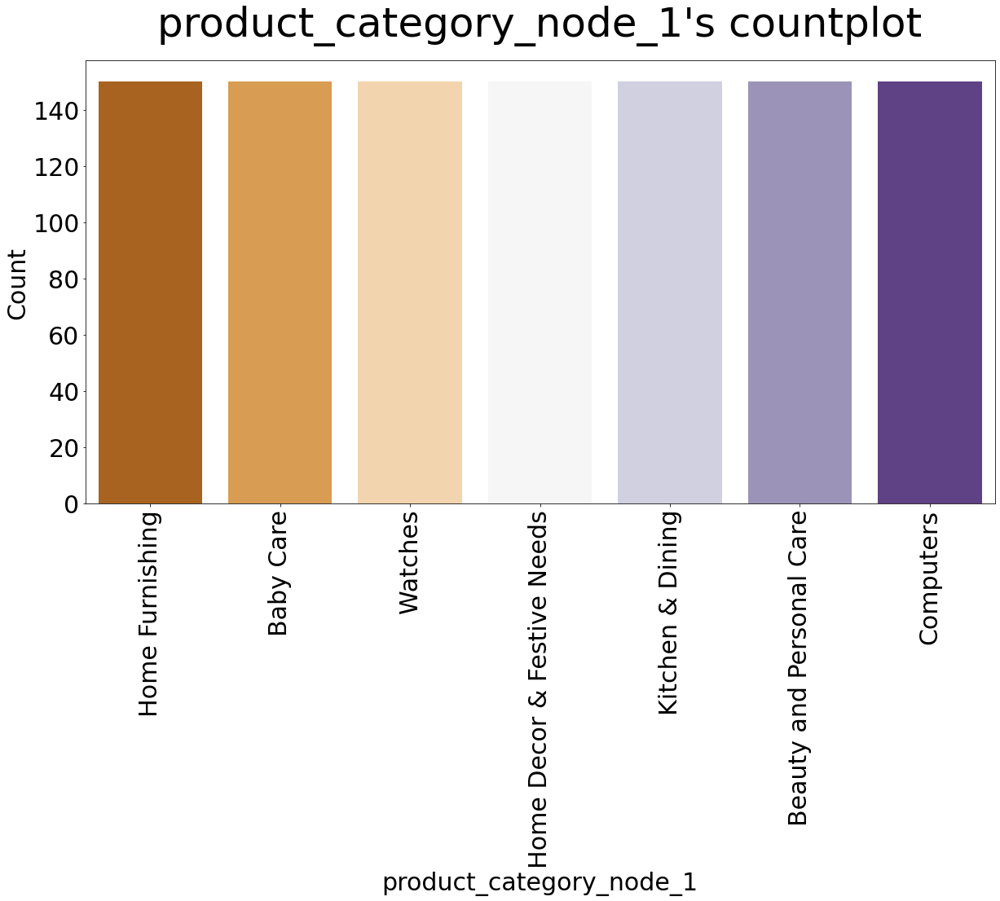

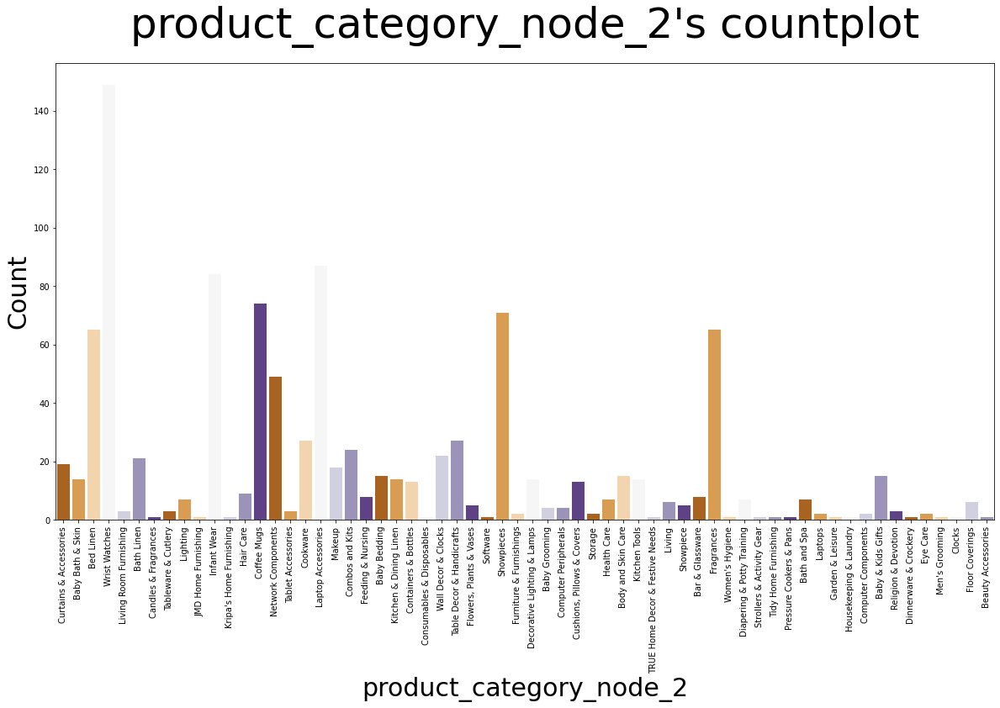

In [25]:
# Plots product_category_node_1's countplot

fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(data=flipkart_fork_1,
              x='product_category_node_1',
              palette=sns.color_palette('PuOr', 7),
              ax=ax)

ax.tick_params(labelsize=tick_size)
ax.tick_params(axis='x', rotation=90)
ax.set_xlabel('product_category_node_1', fontsize=text_size)
ax.set_ylabel('Count', fontsize=text_size)

plt.title('product_category_node_1\'s countplot',
          fontsize=title_size,
          pad=30)
plt.show();

# Plots product_category_node_2's countplot

fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(data=flipkart_fork_1,
              x='product_category_node_2',
              palette=sns.color_palette('PuOr', 7),
              ax=ax)

ax.tick_params(labelsize=tick_size - 20)
ax.tick_params(axis='x', rotation=90)
ax.set_xlabel('product_category_node_2', fontsize=text_size)
ax.set_ylabel('Count', fontsize=text_size)

plt.title('product_category_node_2\'s countplot',
          fontsize=title_size,
          pad=30)
plt.show();

In [26]:
# Double check

flipkart_fork_1['product_category_node_1'].value_counts()

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: product_category_node_1, dtype: int64

In [47]:
# Defines dictionnary of category node 1 with relative numerical idx

product_category_node_1_dict = {
    'Home Furnishing': 0,
    'Baby Care': 1,
    'Watches': 2,
    'Home Decor & Festive Needs': 3,
    'Kitchen & Dining': 4,
    'Beauty and Personal Care': 5,
    'Computers': 6}

# Creates product category node 1 numerical serie

flipkart_fork_1['product_category_node_1_numerical'] = \
    flipkart_fork_1['product_category_node_1']\
        .apply(lambda x: product_category_node_1_dict[x])

# Displays head of product_category_node_1_numerical

flipkart_fork_1['product_category_node_1_numerical'].head()

0    0
1    1
2    1
3    0
4    0
Name: product_category_node_1_numerical, dtype: int64

<h6>NLP EDA

In [27]:
# Imports spacy english large pipeline

nlp = spacy.load("en_core_web_lg")

In [28]:
# Tokenizes the descriptions

flipkart_fork_1['description_tokenized_no_punct'] = \
    flipkart_fork_1['description'].apply(tokenize_doc_no_punct)

flipkart_fork_1['description_tokenized_no_punct']

0       [key, features, of, elegance, polyester, multi...
1       [specifications, of, sathiyas, cotton, bath, t...
2       [key, features, of, eurospa, cotton, terry, fa...
3       [key, features, of, santosh, royal, fashion, c...
4       [key, features, of, jaipur, print, cotton, flo...
                              ...                        
1045    [oren, empower, extra, large, self, adhesive, ...
1046    [wallmantra, large, vinyl, sticker, sticker, p...
1047    [buy, uberlyfe, extra, large, pigmented, polyv...
1048    [buy, wallmantra, medium, vinyl, sticker, stic...
1049    [buy, uberlyfe, large, vinyl, sticker, for, rs...
Name: description_tokenized_no_punct, Length: 1050, dtype: object

In [29]:
# Creates a list of the documents tokenized, this is the corpora 

corpora = flipkart_fork_1['description_tokenized_no_punct'].tolist()

# Computes one list for all the corpora lists

corpora_flat = [item for sublist in corpora for item in sublist]

# Computes the words occurences into a FreqDist object

corpora_frequency = nltk.FreqDist(corpora_flat)

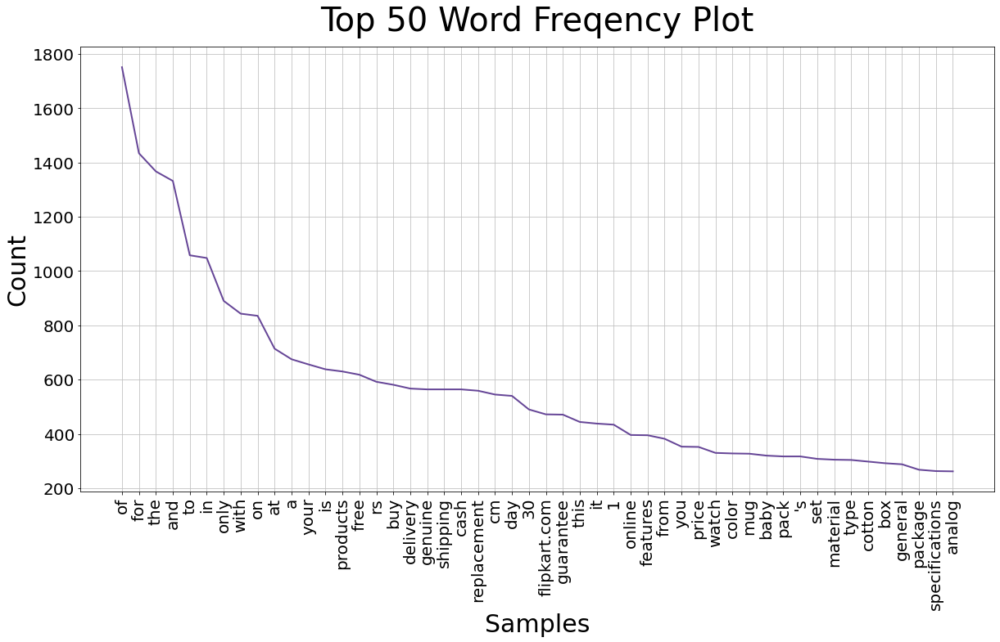

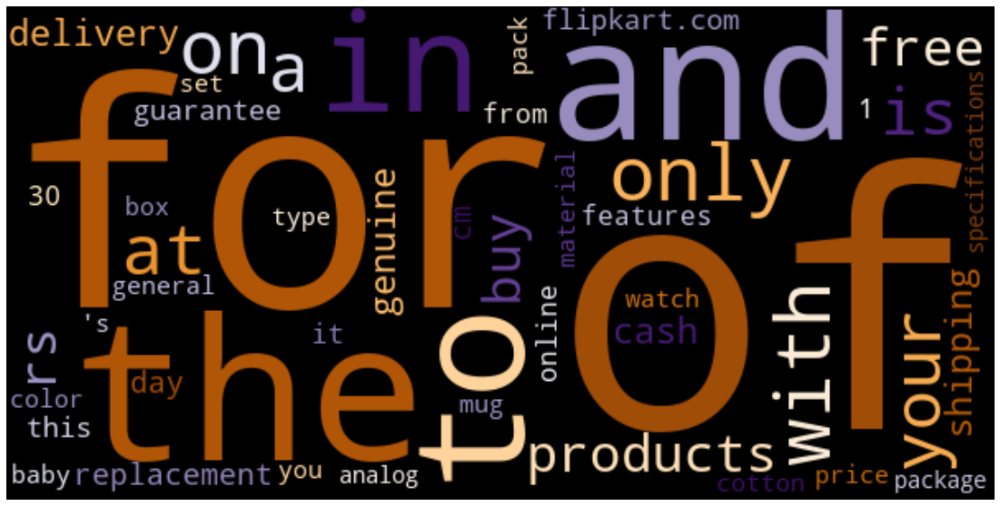

In [30]:
# Plots countplot

fig, ax = plt.subplots(figsize=(20, 10))

ax = corpora_frequency.plot(50,
                            cumulative=False,
                            show=False,
                            color=sns.color_palette('PuOr')[5])

ax.tick_params(labelsize=tick_size - 10)
ax.set_xlabel('Samples', fontsize=text_size)
ax.set_ylabel('Count', fontsize=text_size)

plt.title('Top 50 Word Freqency Plot',
          fontsize=title_size - 10,
          pad=20)

plt.show();

# Plots Wordcloud

wcloud = \
    WordCloud(colormap=sns.color_palette('PuOr', as_cmap=True),
              background_color='black',
              contour_color='black',
              width=600,
              height=300,
              max_words=50,
              random_state=random_seed)\
    .generate_from_frequencies(corpora_frequency)

fig, ax = plt.subplots(1, 1, figsize=(20, 10))

plt.imshow(wcloud, interpolation='bilinear')
plt.axis("off")
plt.show();

In [31]:
# Displays the 10 first descriptions per categories

for i in flipkart_fork_1['product_category_node_1'].unique():
    print('\033[1m' + i + ":")
    
    flipkart_fork_1[
    flipkart_fork_1['product_category_node_1'] == i]\
    ['description'].iloc[:10].tolist()

Home Furnishing:


['Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that yo

Baby Care:


['Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel',
 'Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our pr

Watches:


['Maserati Time R8851116001 Analog Watch  - For Boys - Buy Maserati Time R8851116001 Analog Watch  - For Boys  R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!',
 'Camerii WM64 Elegance Analog Watch  - For Men, Boys - Buy Camerii WM64 Elegance Analog Watch  - For Men, Boys  WM64 Online at Rs.449 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!',
 'T STAR UFT-TSW-005-BK-BR Analog Watch  - For Boys\r\n                         Price: Rs. 399\r\n\t\t\t\t\r\n\t\t\tWhether you are on your way to work or travelling abroad with family, lifestyle accessories like watches, wallets and belts help to add a touch of sophistication and class to your otherwise mundane and regular daily wear. When it all comes down to it, suave leather belts and intricately designed and finished timepieces are what s

Home Decor & Festive Needs:


['Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener (30 ml)\r\n                         Price: Rs. 245\r\n\t\t\t\t\r\n\t\t\tIlluminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brought To You By Myesquire. This Is A Very Unique, Useful And Value for Money Product For Home Decoration And Fragrance. This Unique Combo Contains Aroma Burner With All Accessories and is ready to use . Put A Small Amount 1-2 Tea Spoon Of Aroma Oil On The Bowl Surface And Light The Tea Light and After Few Minutes As The Oil Heats Up, The Fragrance Will Spread In The Room. And You Will Be All Set To Enjoy The Captivating Aroma. Keep It Away From Children As Surface Becomes Hot.\r\nIlluminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brought To You By Myesquire. This Is A Very Unique, Useful And Value for Money Product For Home Decoration And Fragrance. This Uniqu

Kitchen & Dining:


['Key Features of Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set Jug: Height- 8 inches, Dia - 4.2 inches, Depth 7.5 inches, Width 7 inches,capacity 1744 ml, Weight - 430 Grams,Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set (Copper) Price: Rs. 1,399 Copper Utensils And Serving Copper Ware Helped To Prevent The Spread Of Diseases. In Many Tests It Showed That 99.9% Of The Bacteria On Copper Alloy Surfaces (With 65% Or Greater Copper Content) Were Eliminated Within 2 Hours Of Exposure. According To Research At Southampton University In The U.K., Mrsa Microbes Remain Alive On Stainless Steel Surfaces For Up To Three Days, Whereas The Same Microbes On A Copper Surface Are Eliminated Within 90 Minutes. These Copper Serving Ware Are Preferred Because It Is Durable And It Has Excellent Characteristics. The Ageless Use Of Copper Bears Testimony To Its Myriad Virtues And Everlasting Appeal. Its Therapeutic Value Has Been Handed Down To Us Through The Ages. In Fact, Water Stored In 

Beauty and Personal Care:


['Key Features of Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner Ideal For: Boys, Girls Applied For: Deep Conditioning Hair Condition: Damaged Hair Hair Type: Dry Hair,Specifications of Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner (147.5 ml) Conditioner Traits Hair Condition Damaged Hair Hair Type Dry Hair Applied For Deep Conditioning Ideal For Boys, Girls General Traits Brand Burt s Bees Quantity 147.5 ml Model Name Hair Repair Shea And Grapefruit Deep Conditioner In the Box 1 Conditioner',
 'Key Features of Suave Naturals Everlasting Sunshine Conditioner Ideal For: Boys, Girls Applied For: Conditioning Hair Condition: Damaged Hair Hair Type: Dry Hair,Specifications of Suave Naturals Everlasting Sunshine Conditioner (665 ml) Conditioner Traits Hair Condition Damaged Hair Hair Type Dry Hair Applied For Conditioning Ideal For Boys, Girls General Traits Brand Suave Quantity 665 ml Model Name Naturals Everlasting Sunshine Conditioner In the Box 1 Conditioner

Computers:


['Key Features of D-Link DAP1320 QRS app(iOS,Android),Specifications of D-Link DAP1320 (White) Speed Wireless Speed 300 Mbps DSL Modem Speed 300 Mbps General Brand D-Link In The Box Extender Plug Model DAP1320 Type Range Extenders/Repeaters Color White Warranty Covered in Warranty No damage Warranty Summary 3years Service Type No damage Not Covered in Warranty damaged will not repair Dimensions Weight 69 g Connectivity Number of Antennae 2 Number of USB Ports 0 Antennae Internal Supported Protocols Standard IEEE IEEE 802.11n/g/b Operating Conditions Operating Humidity Operating: 10% to 90% non-condensing // Storage: 5% to 95% non-condensing Temperature Operating: 0 to 40 °C (32 to 104 °F)//Storage: -20 to 65 °C (-4 to 149 °F) degree C Additional Features Certification FCC, IC, CE',
 "Key Features of RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard Size: Handheld,RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard (White) Price: Rs. 399 Working Environment. It

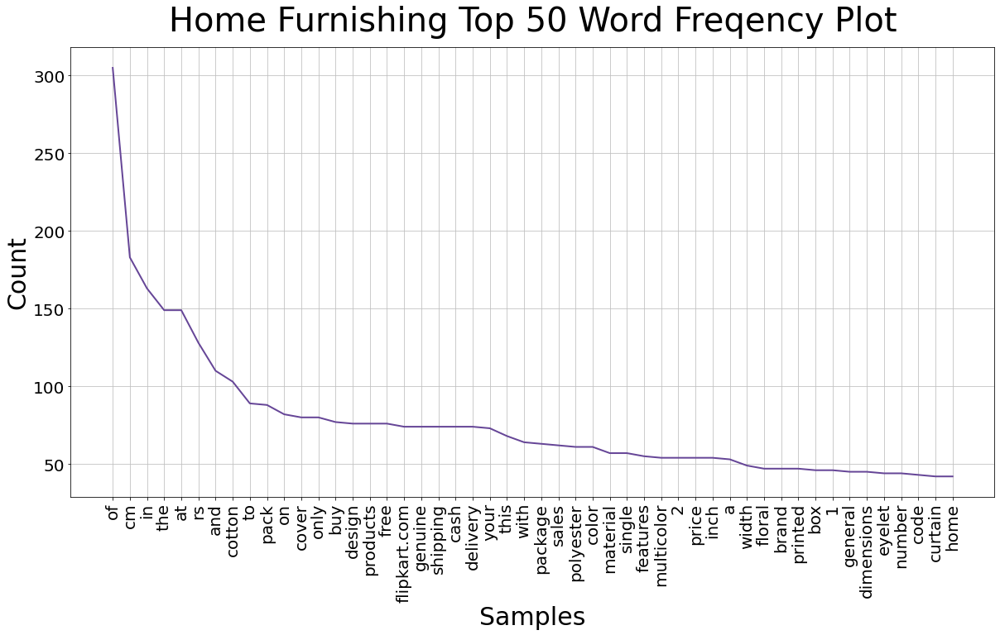

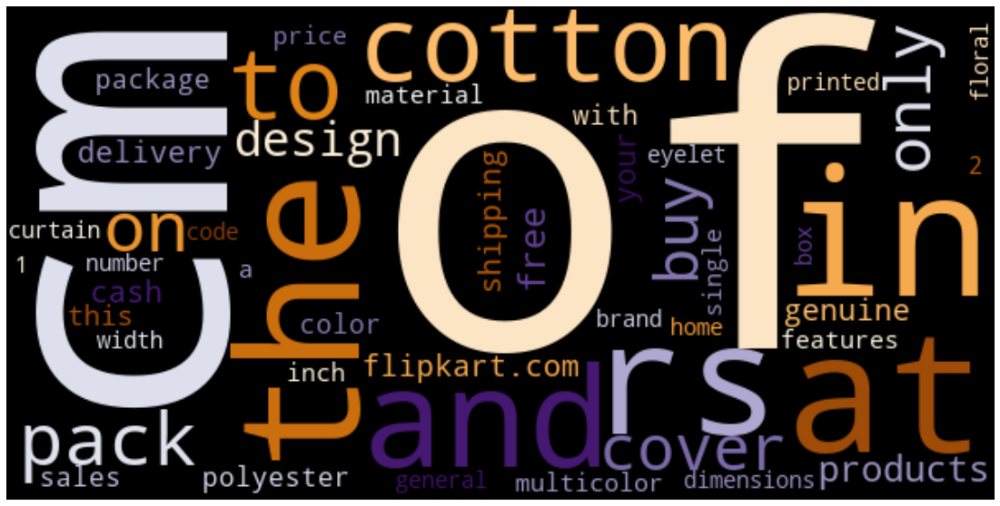

----------------------------------------------------


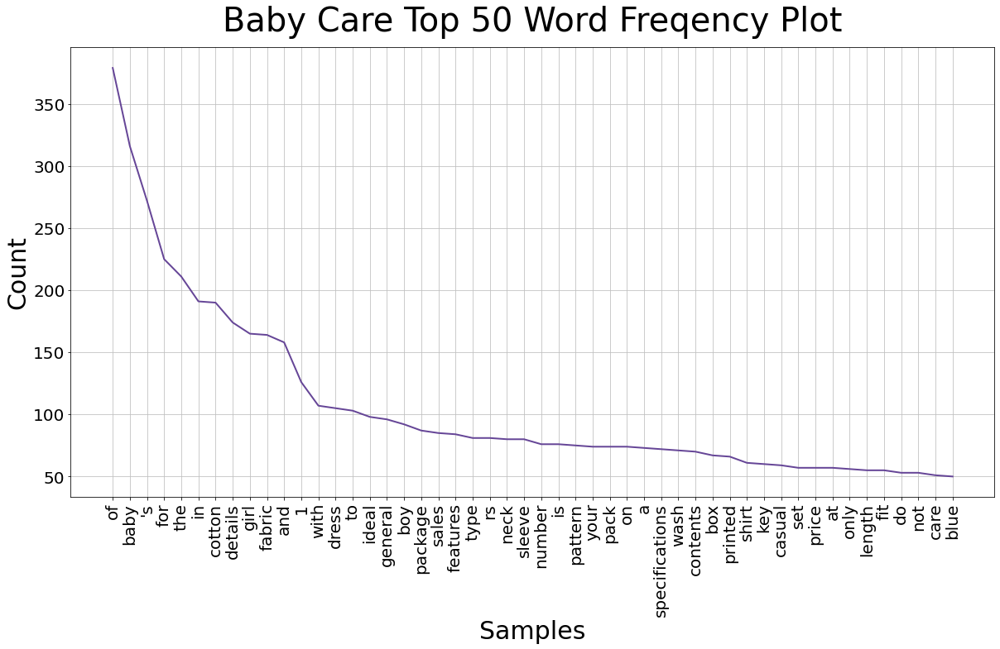

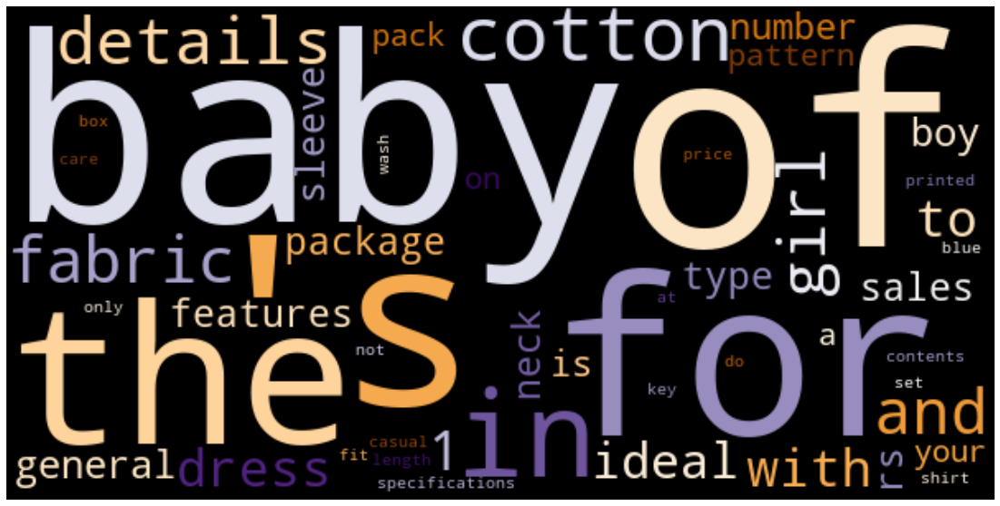

----------------------------------------------------


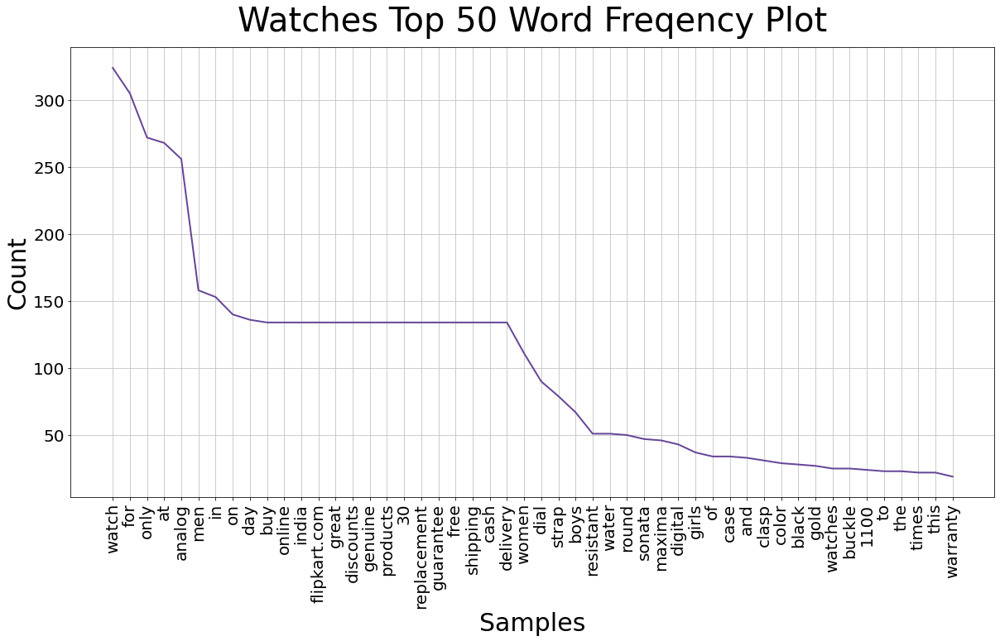

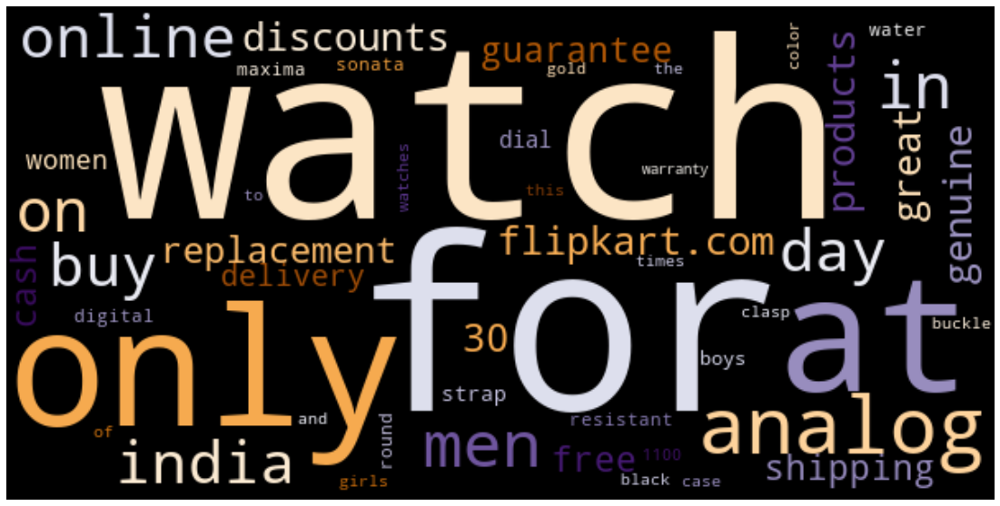

----------------------------------------------------


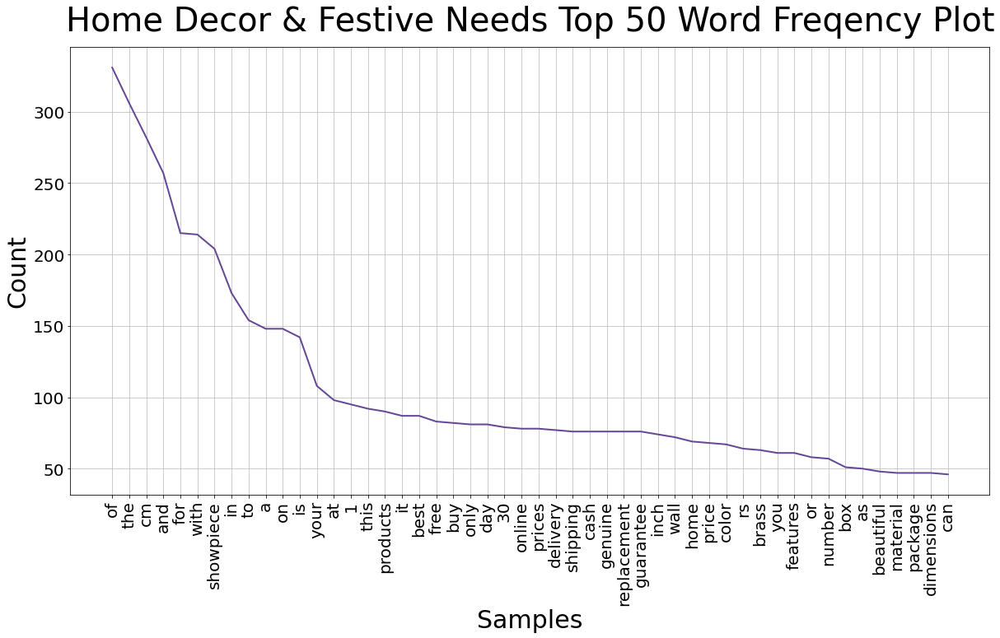

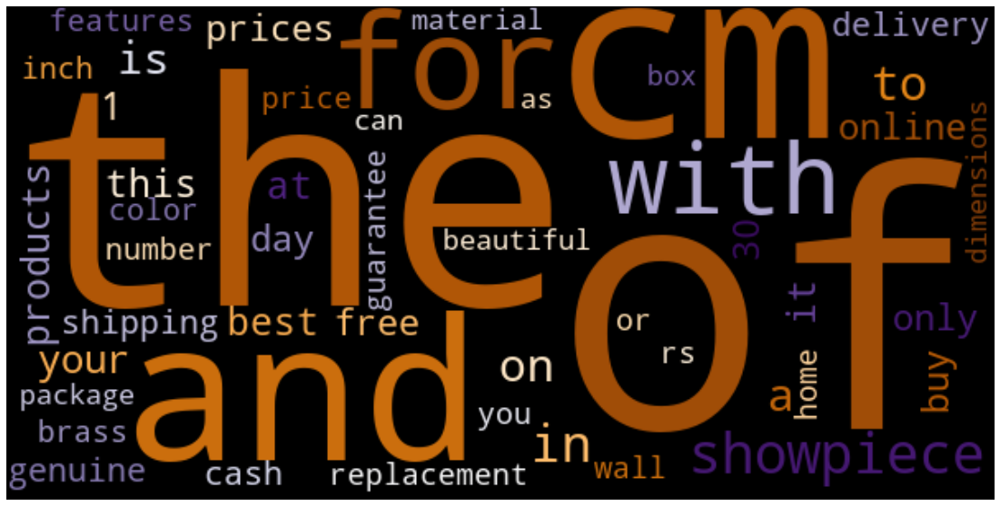

----------------------------------------------------


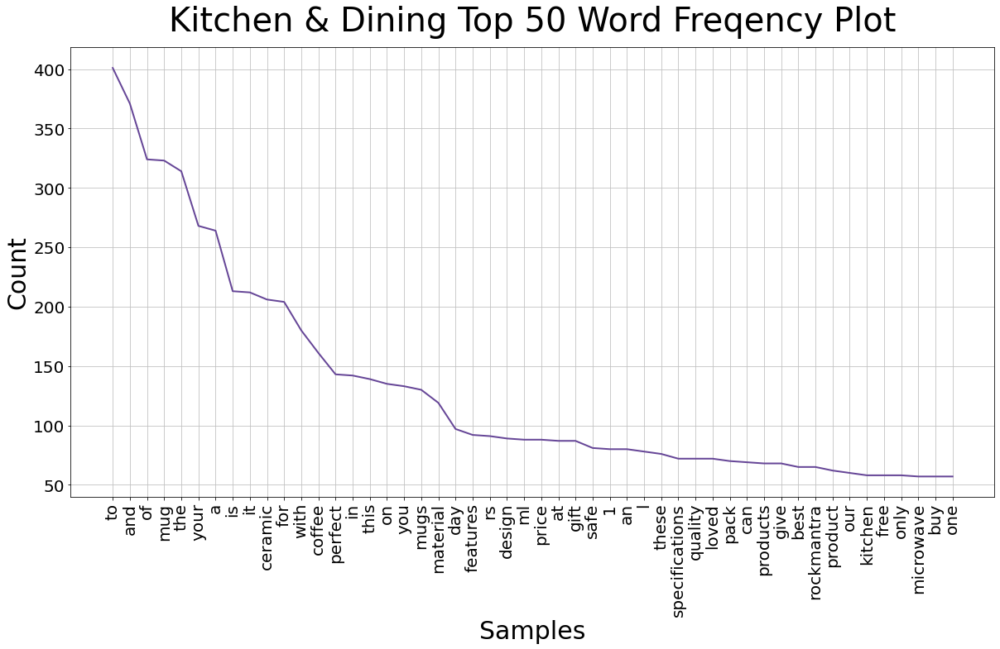

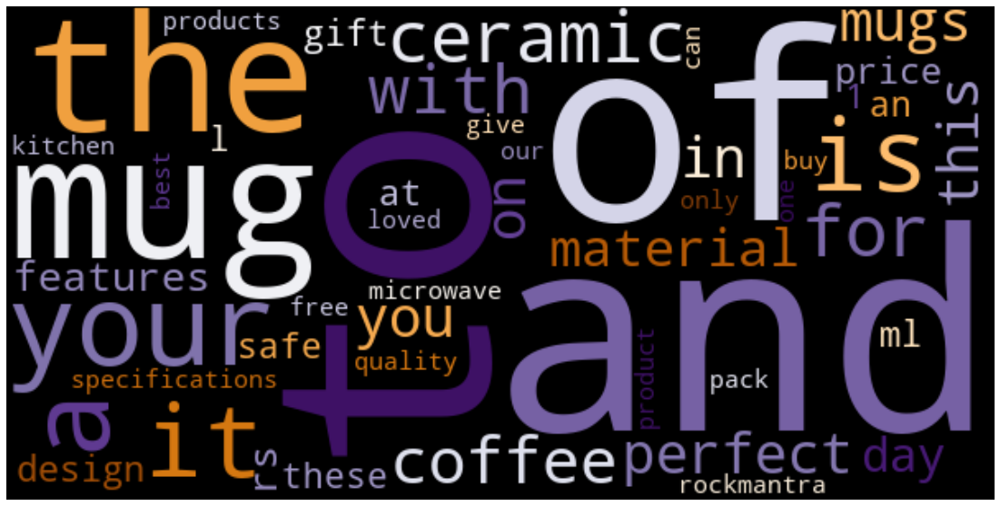

----------------------------------------------------


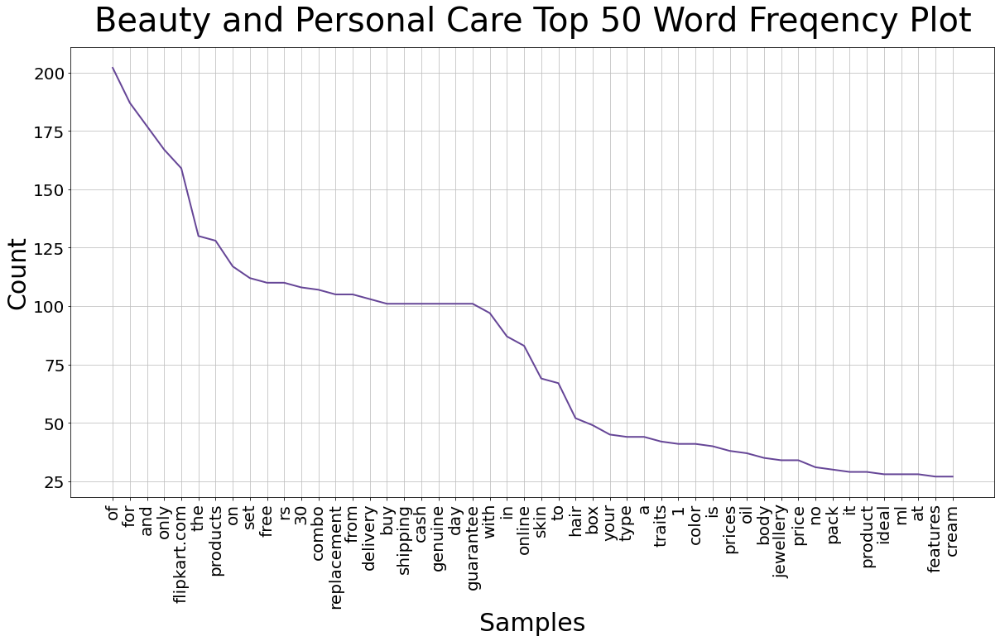

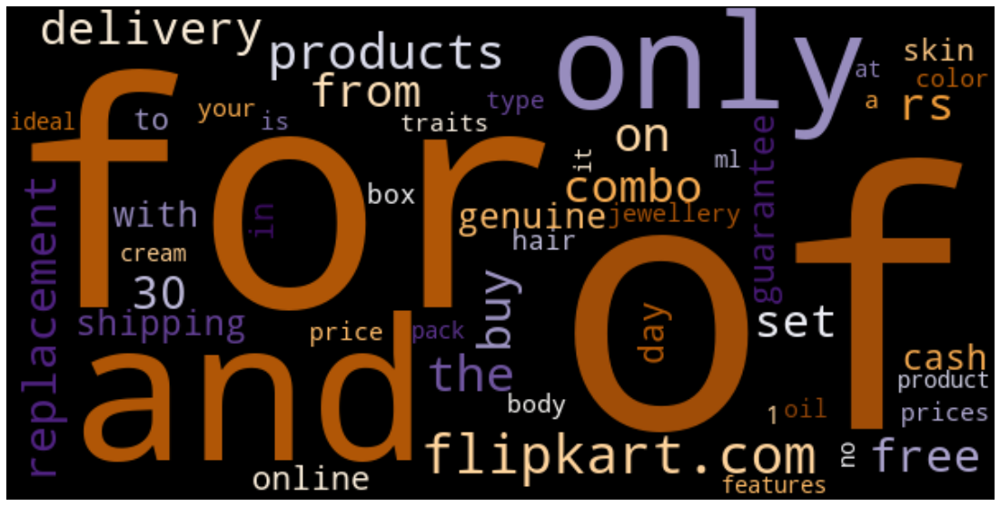

----------------------------------------------------


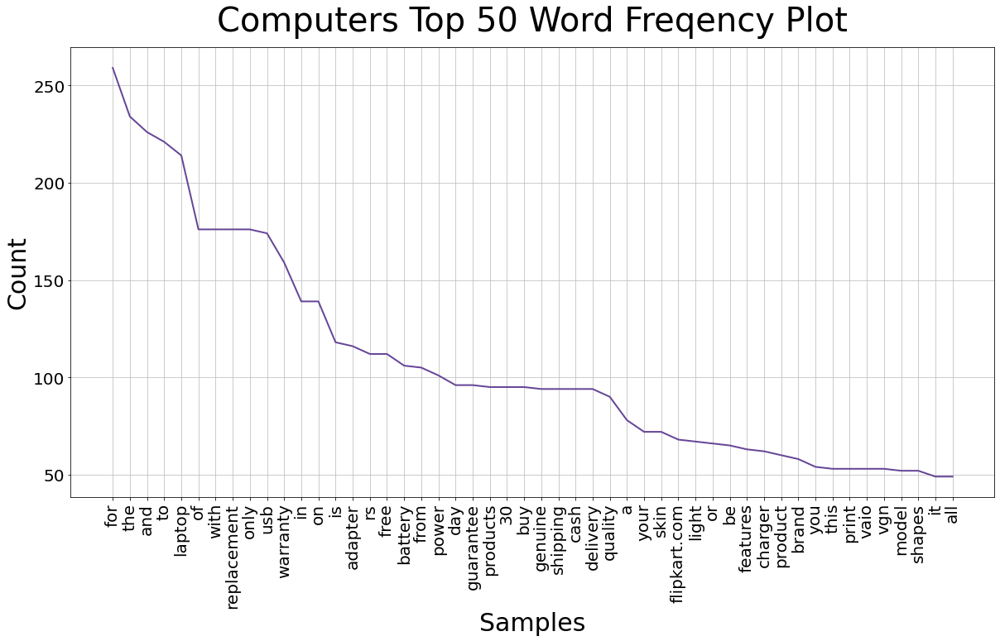

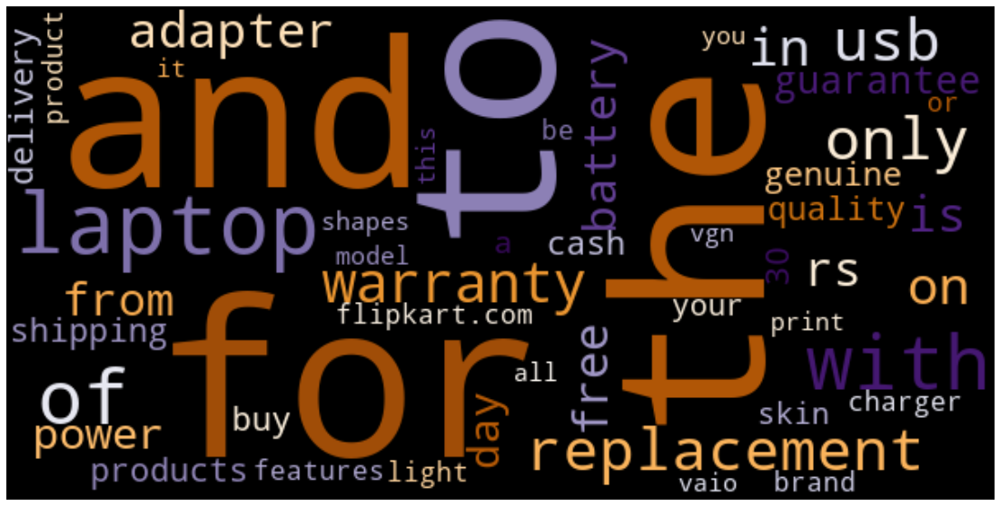

----------------------------------------------------


In [32]:
# Plots Countplot and Wordcloud without word preprocessing

for i in flipkart_fork_1['product_category_node_1'].unique():

    category_tokeinzed_descriptions_list = \
        flipkart_fork_1[
            flipkart_fork_1['product_category_node_1'] == i]\
            ['description_tokenized_no_punct'].tolist()

    category_tokeinzed_descriptions_list_flat = \
        [item for sublist in category_tokeinzed_descriptions_list for item in sublist]

    category_frequency = nltk.FreqDist(category_tokeinzed_descriptions_list_flat)

    
    # Plots countplot

    fig, ax = plt.subplots(figsize=(20, 10))

    ax = category_frequency.plot(50,
                                 cumulative=False,
                                 show=False,
                                 color=sns.color_palette('PuOr')[5])

    ax.tick_params(labelsize=tick_size - 10)
    ax.set_xlabel('Samples', fontsize=text_size)
    ax.set_ylabel('Count', fontsize=text_size)

    plt.title('{} Top 50 Word Freqency Plot'.format(i),
              fontsize=title_size - 10,
              pad=20)

    plt.show()

    # Plots Wordcloud

    wcloud = \
        WordCloud(colormap=sns.color_palette('PuOr', as_cmap=True),
                  background_color='black',
                  contour_color='black',
                  width=600,
                  height=300,
                  max_words=50,
                  random_state=random_seed)\
        .generate_from_frequencies(category_frequency)

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))

    plt.imshow(wcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

    print('----------------------------------------------------')

plt.show();

<h6>Removing Stop Words

In [33]:
# Retrieves Spacy's defaul stop words

stop_words = list(nlp.Defaults.stop_words)

# Retrieves the most frequent words in the whole 
# corpora that aren't in the default stop words

most_frequent_words = \
    [i for i in dict(corpora_frequency.most_common(35)).keys() 
     if i not in stop_words]


# Displays the length of each above retrieved lists

len(stop_words), len(most_frequent_words)

# Unites the two above lists

stop_words += most_frequent_words

# Displays the lenght of the updated stop_word list

len(stop_words)

(326, 18)

344

In [34]:
# Creates description_tokenized_no_punct_no_stop_words

flipkart_fork_1['description_tokenized_no_punct_no_stop_words'] = \
    flipkart_fork_1['description']\
        .apply(lambda x : tokenize_doc_no_punct_no_stop_words(x, stop_words))

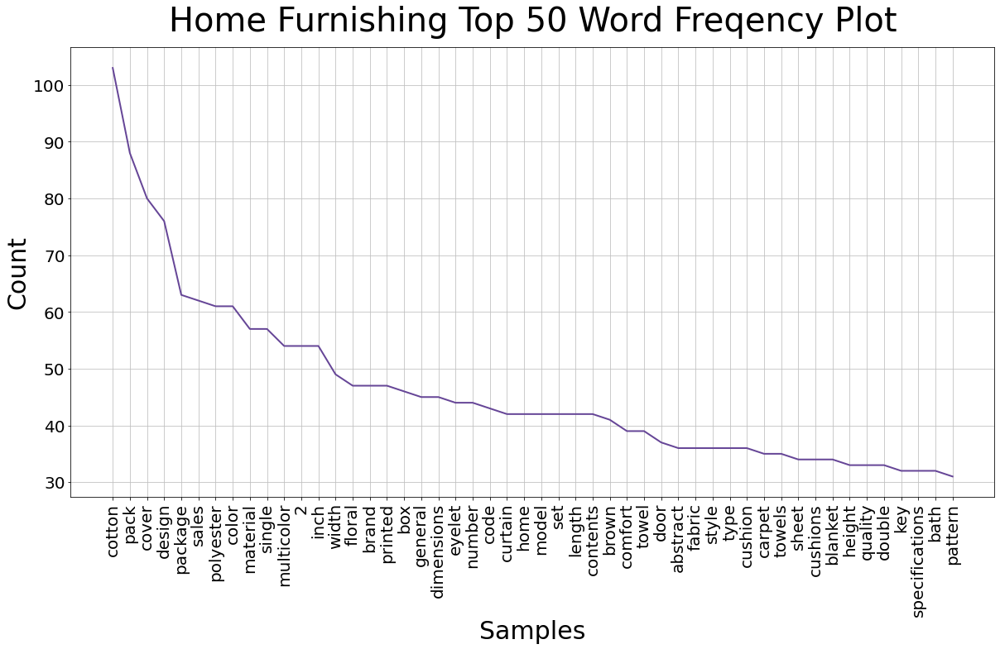

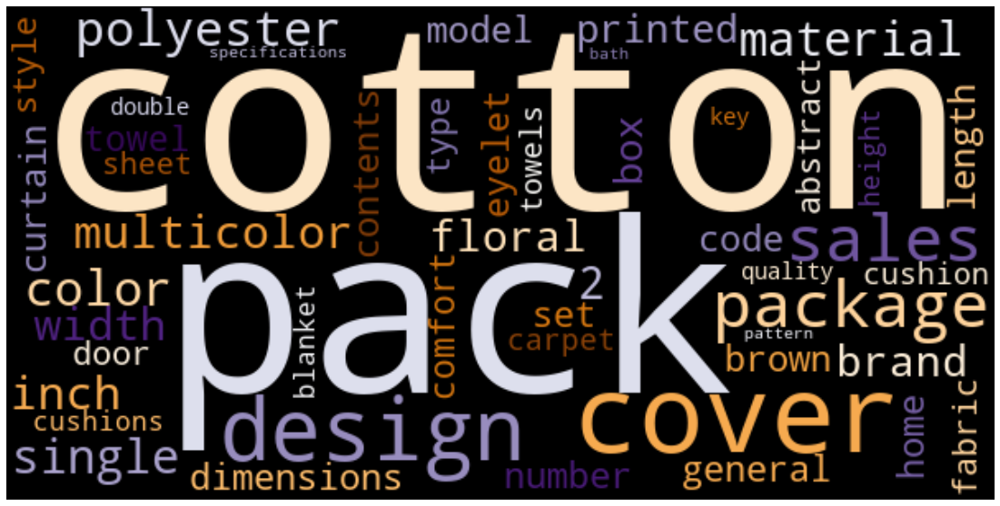

----------------------------------------------------


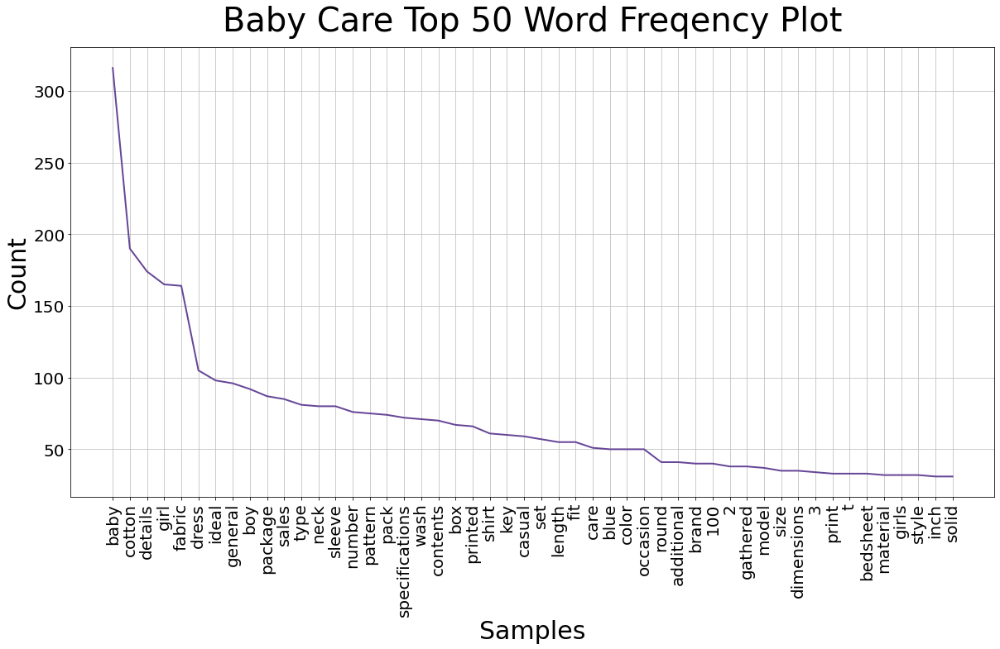

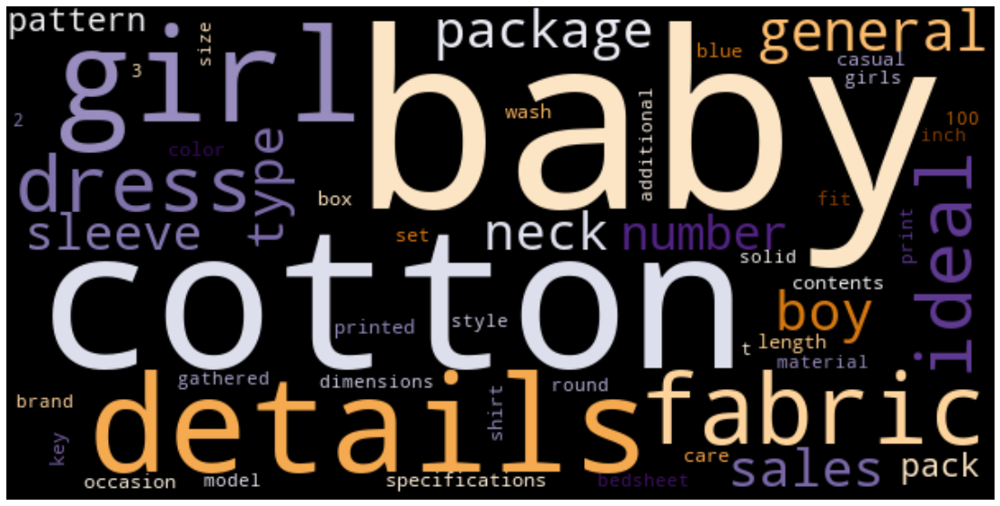

----------------------------------------------------


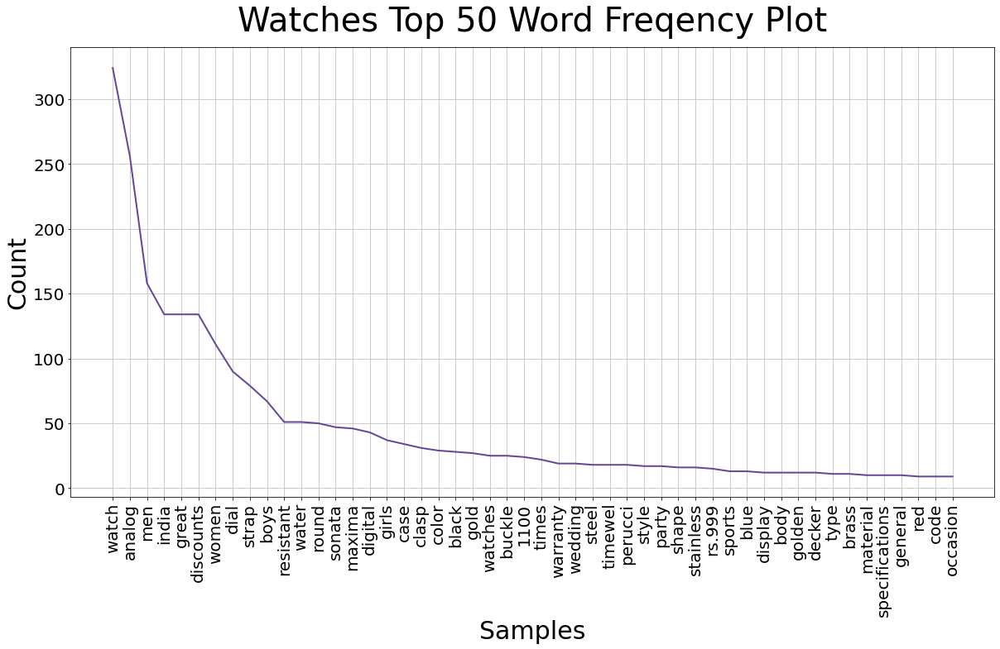

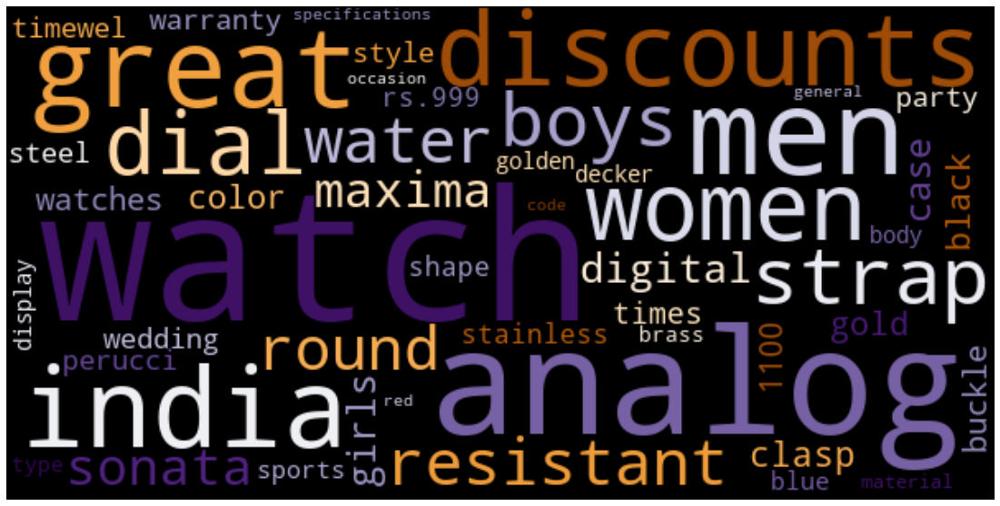

----------------------------------------------------


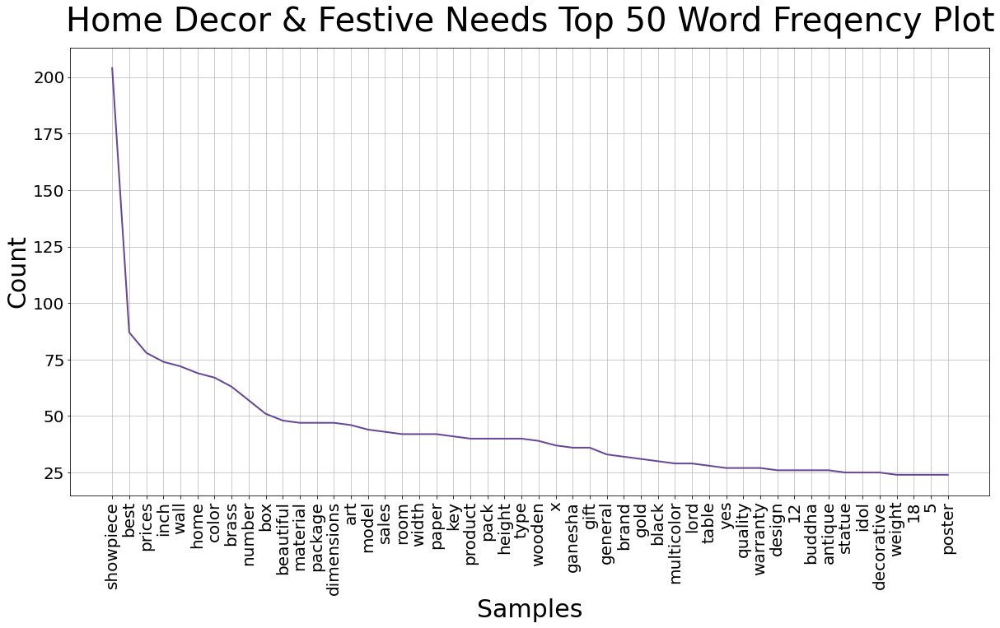

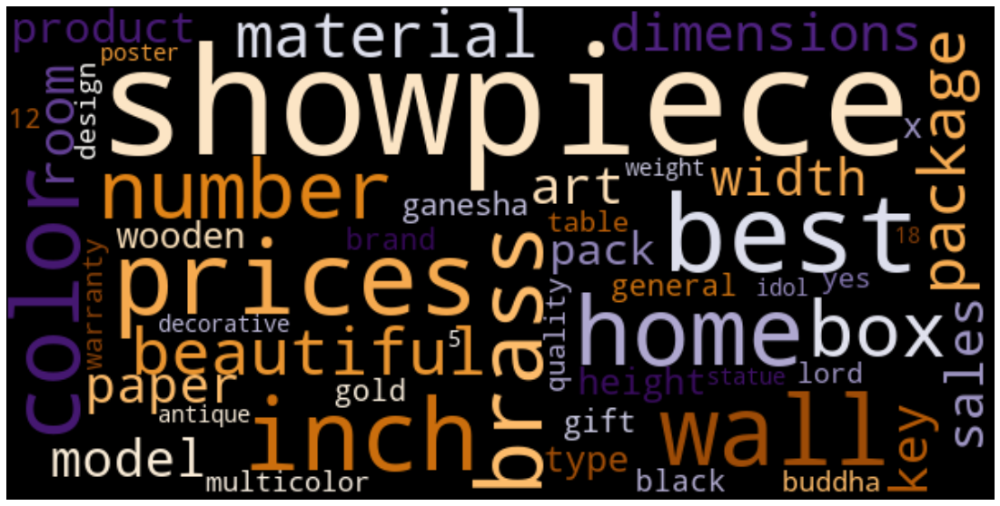

----------------------------------------------------


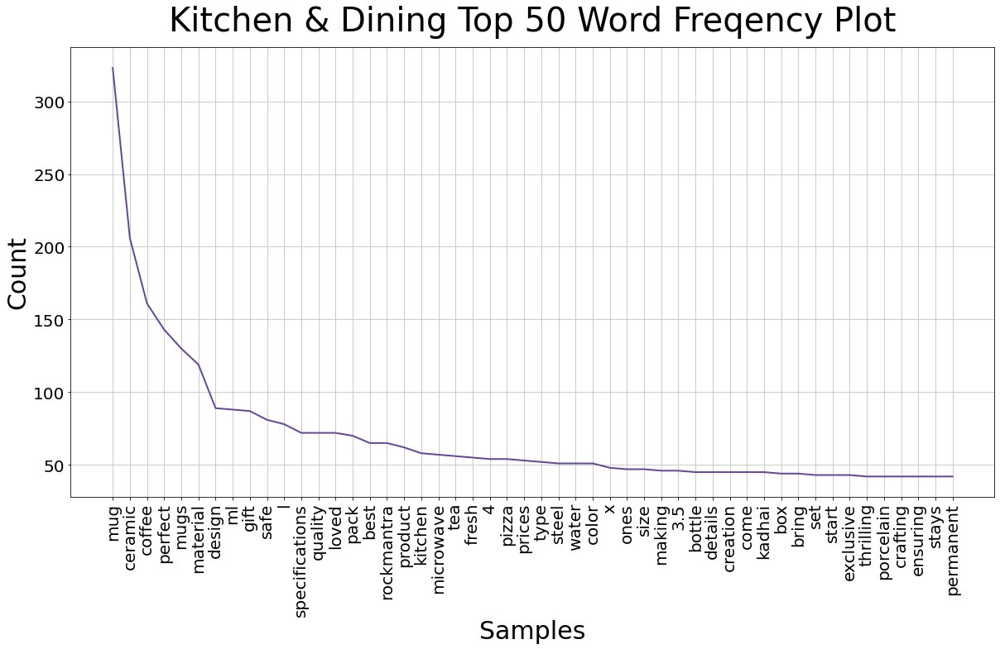

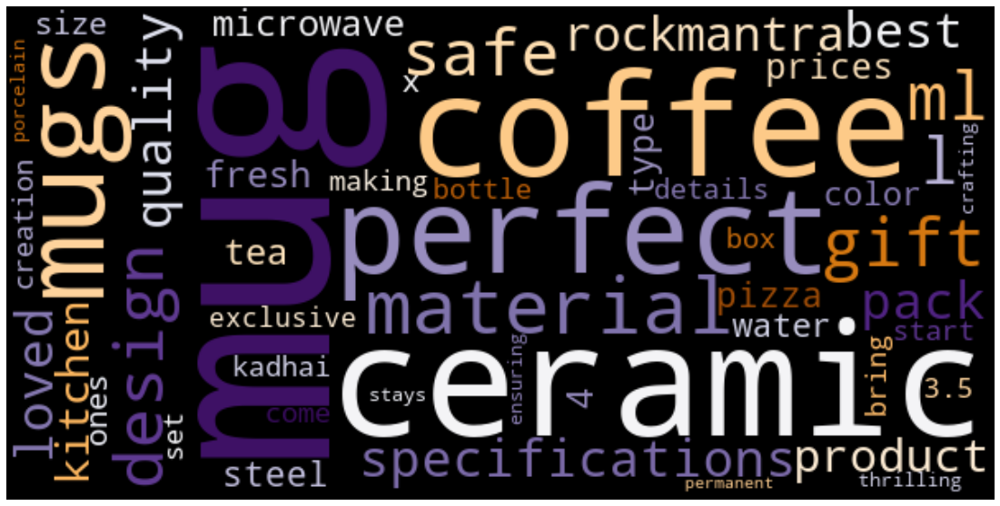

----------------------------------------------------


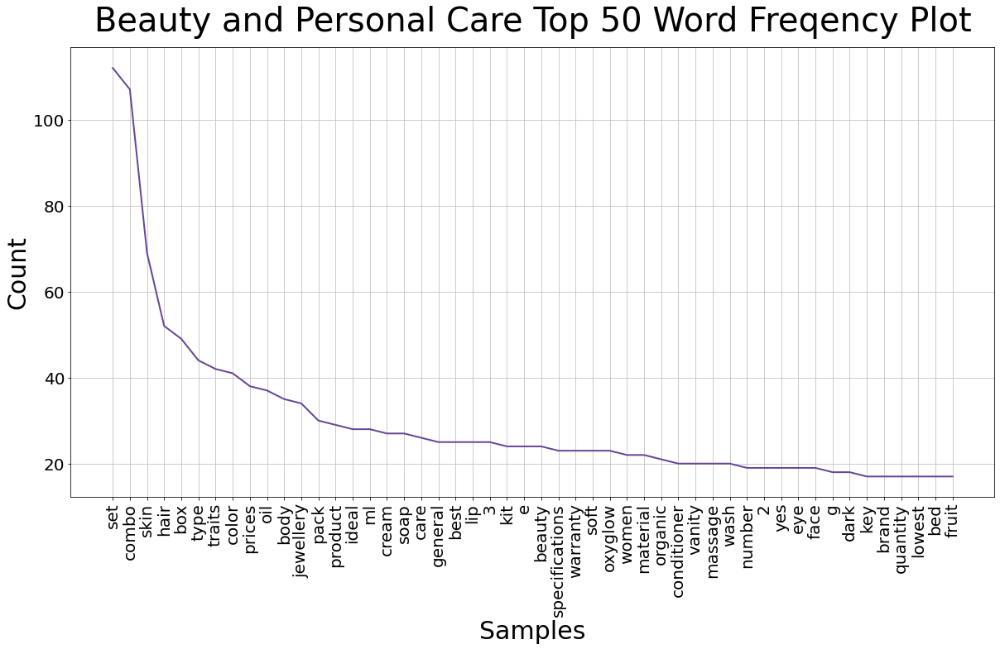

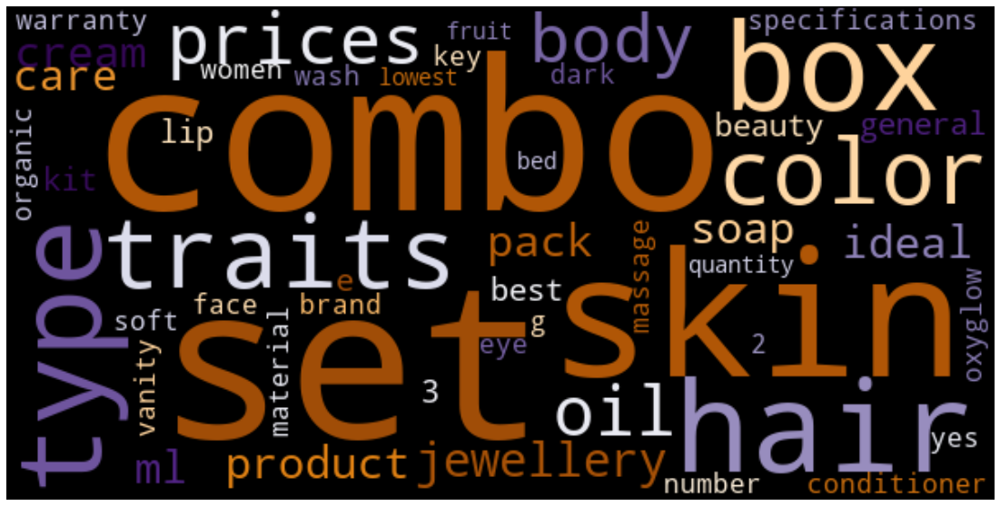

----------------------------------------------------


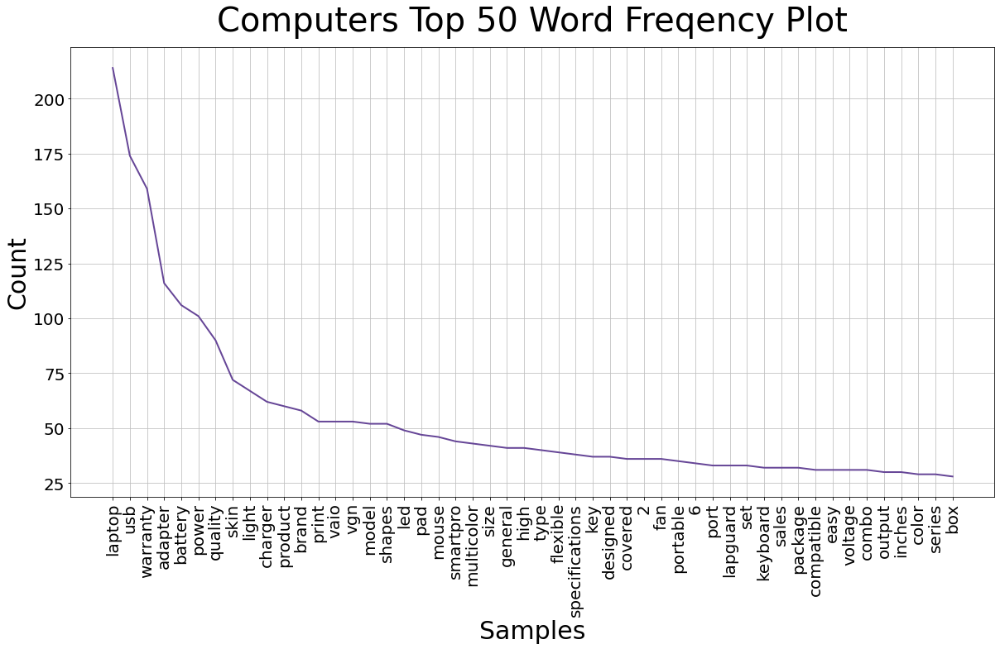

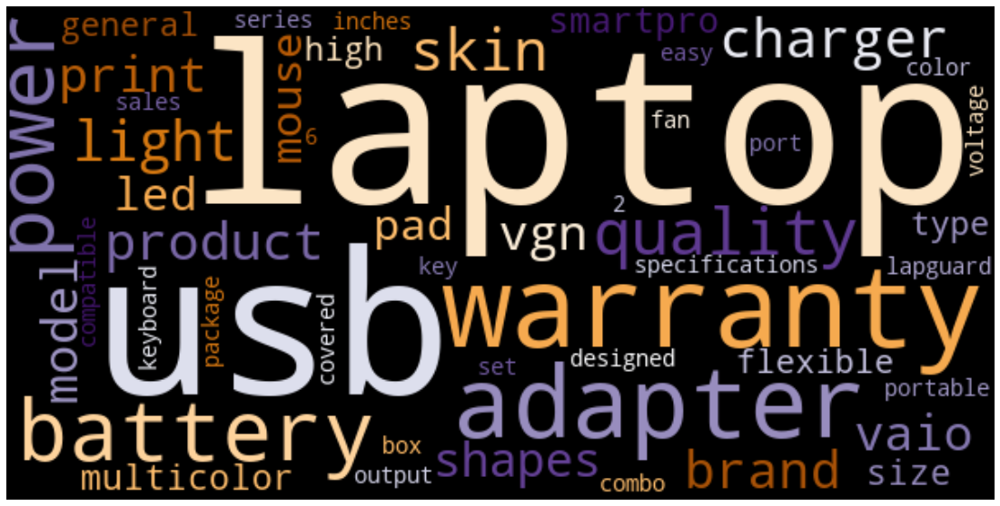

----------------------------------------------------


In [35]:
# Plots Countplot and Wordcloud with a basic word preprocessing

for i in flipkart_fork_1['product_category_node_1'].unique():

    category_tokeinzed_descriptions_list = \
        flipkart_fork_1[
            flipkart_fork_1['product_category_node_1'] == i]\
            ['description_tokenized_no_punct_no_stop_words'].tolist()

    category_tokeinzed_descriptions_list_flat = \
        [item for sublist in category_tokeinzed_descriptions_list for item in sublist]

    category_frequency = nltk.FreqDist(category_tokeinzed_descriptions_list_flat)

    
    # Plots countplot

    fig, ax = plt.subplots(figsize=(20, 10))

    ax = category_frequency.plot(50,
                                 cumulative=False,
                                 show=False,
                                 color=sns.color_palette('PuOr')[5])

    ax.tick_params(labelsize=tick_size - 10)
    ax.set_xlabel('Samples', fontsize=text_size)
    ax.set_ylabel('Count', fontsize=text_size)

    plt.title('{} Top 50 Word Freqency Plot'.format(i),
              fontsize=title_size - 10,
              pad=20)

    plt.show()

    # Plots Wordcloud

    wcloud = \
        WordCloud(colormap=sns.color_palette('PuOr', as_cmap=True),
                  background_color='black',
                  contour_color='black',
                  width=600,
                  height=300,
                  max_words=50,
                  random_state=random_seed)\
        .generate_from_frequencies(category_frequency)

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))

    plt.imshow(wcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

    print('----------------------------------------------------')

plt.show();

<h6>Computer Vision EDA

In [36]:
# Conveniency feature for image path

flipkart_fork_1['image_path'] = flipkart_fork_1['image'].apply(lambda x : path + x)

Home Furnishing:


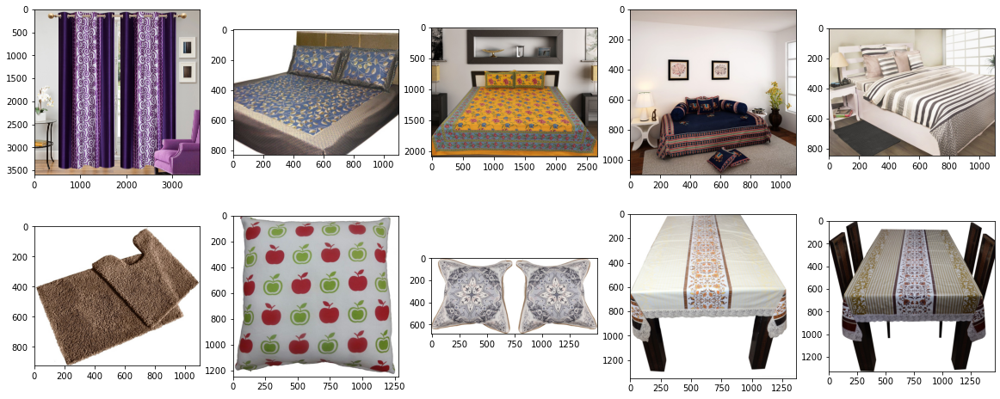

Baby Care:


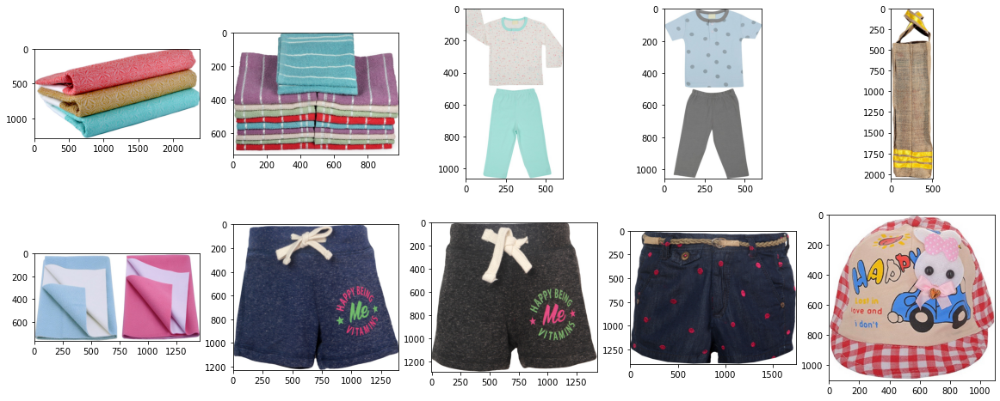

Watches:


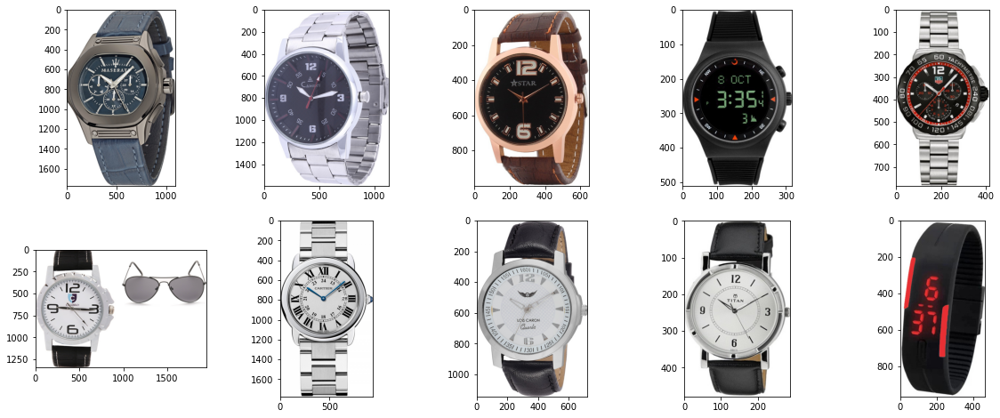

Home Decor & Festive Needs:


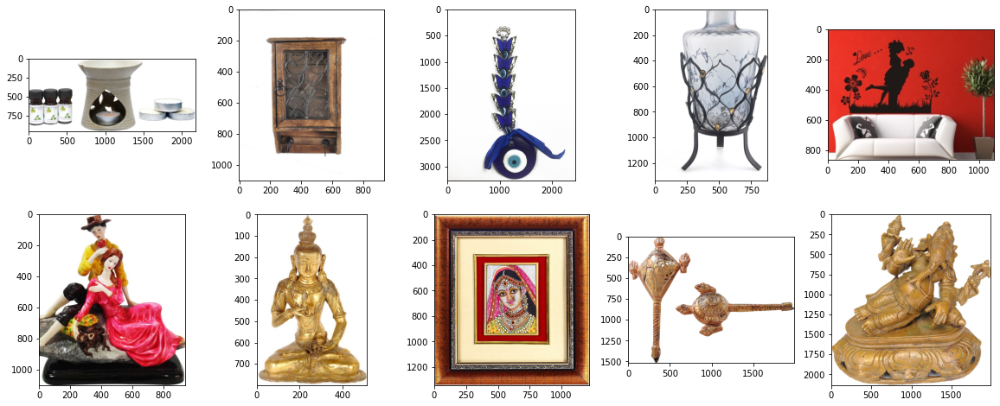

Kitchen & Dining:


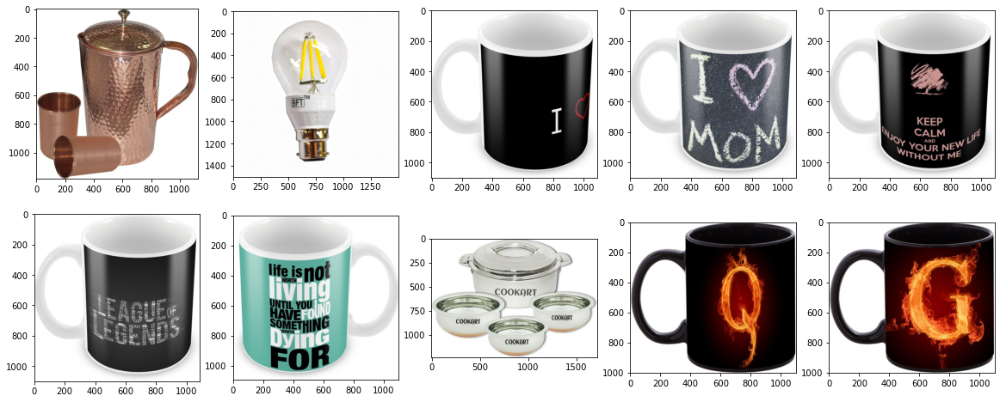

Beauty and Personal Care:


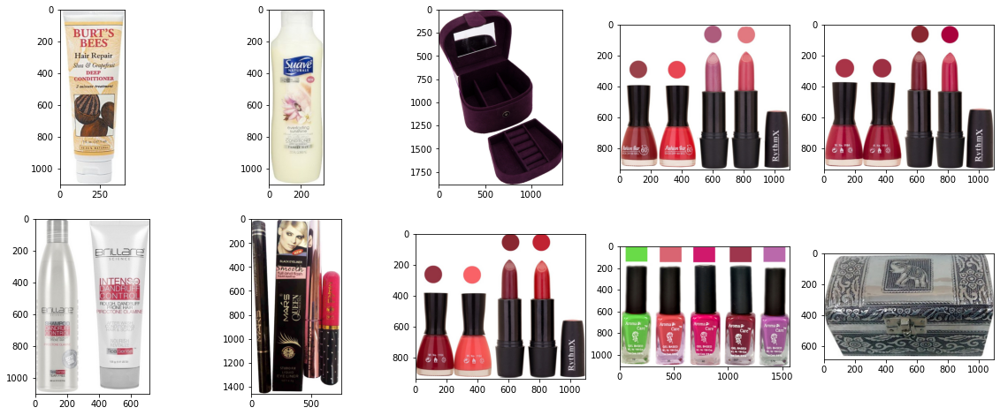

Computers:


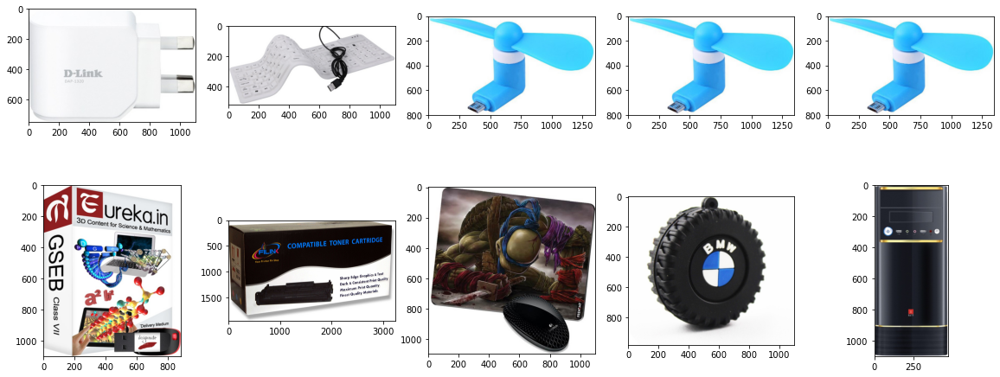

In [37]:
# Displays 10 images for each categorie

for i in flipkart_fork_1['product_category_node_1'].unique():
    
    print('\033[1m' + i + ":")
    
    
    
    
    fig, axes = \
        plt.subplots(figsize=(20,8), ncols=5, nrows=2)
    
    axes = axes.flatten()
    
    for j, k  in enumerate(flipkart_fork_1[
                flipkart_fork_1['product_category_node_1'] == i]\
                ['image_path'].iloc[:10]):
        
        image = cv2.imread(k)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
        axes[j].imshow(image_rgb)
        
    plt.show();
    
plt.show();

<h6>Computer vision Equalization, SIFT and ORB example

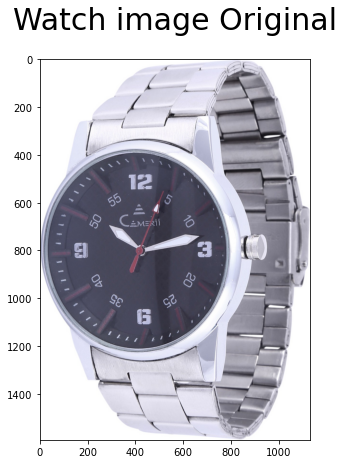

In [38]:
# Reads an image

watch_image = cv2.imread(flipkart_fork_1.loc[6,'image_path'])

# Converts it in RGB 

watch_image_rgb = cv2.cvtColor(watch_image, cv2.COLOR_BGR2RGB)

# Displays it

fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(watch_image_rgb)
plt.title('Watch image Original', fontsize=title_size - 20, pad=30)
plt.show();

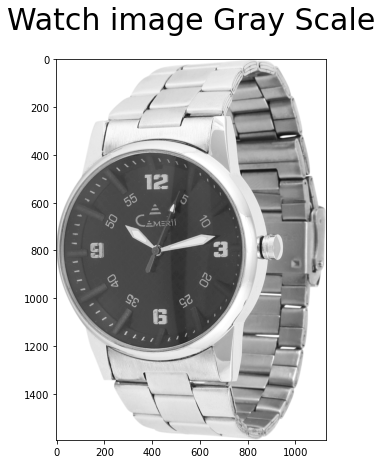

In [39]:
# Converts the BGR image into gray nuances image 

watch_image_gray = cv2.cvtColor(watch_image, cv2.COLOR_BGR2GRAY)

fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(watch_image_gray, cmap='gray')
plt.title('Watch image Gray Scale', fontsize=title_size - 20, pad=30)
plt.show();

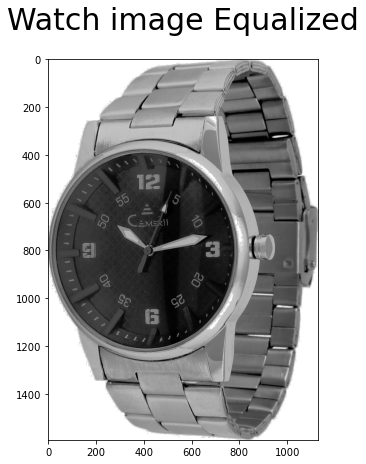

In [40]:
# Displays the gray image equalized

watch_image_gray_equalized = cv2.equalizeHist(watch_image_gray)

fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(watch_image_gray_equalized, cmap='gray')
plt.title('Watch image Equalized', fontsize=title_size - 20, pad=30)
plt.show();

In [41]:
# Loads SIFT and ORB algorithms, the 500 most important keypoints are kept

sift = cv2.SIFT_create(500)
orb = cv2.ORB_create(500)

In [42]:
# Applies the respective algorithms, computes the keypoints and detectors for each

sift_keypoints, sift_descriptors = sift.detectAndCompute(watch_image_gray_equalized, None)
orb_keypoints, orb_descriptors = orb.detectAndCompute(watch_image_gray_equalized, None)

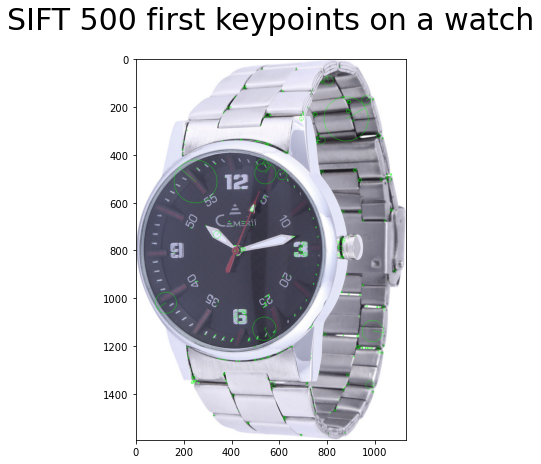

In [43]:
# Displays SIFT keypoints onto the rgb image

sift_image_with_keypoint = \
    cv2.drawKeypoints(watch_image_rgb,
                      sift_keypoints,
                      watch_image_gray,
                      flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
                      color=(0,255,0))
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(sift_image_with_keypoint)
plt.title('SIFT 500 first keypoints on a watch', fontsize=title_size - 20, pad=30)
plt.show();

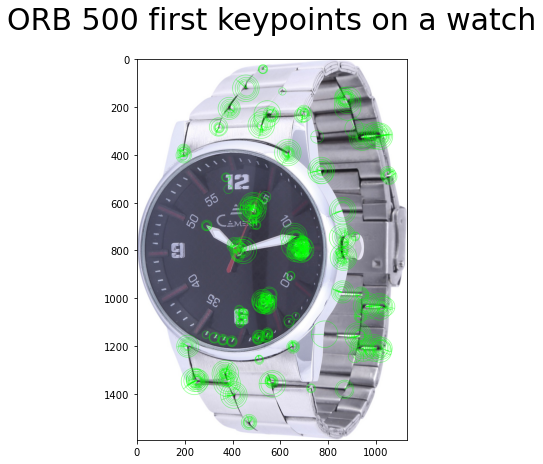

In [44]:
# Displays ORB keypoints onto the rgb image

orb_image_with_keypoint = \
    cv2.drawKeypoints(watch_image_rgb,
                      orb_keypoints,
                      watch_image_gray,
                      flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
                      color=(0,255,0))


fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(orb_image_with_keypoint)
plt.title('ORB 500 first keypoints on a watch', fontsize=title_size - 20, pad=30)
plt.show();

<h6>Export

In [49]:
# Exports the flipkart_fork_1

#flipkart_fork_1\
#    .to_csv(r'F:\Data\Projet 6\Cleaned\flipkart_cleaned', index=False)